<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Общая-информация" data-toc-modified-id="Общая-информация-1">Общая информация</a></span></li><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-2">Предобработка данных</a></span><ul class="toc-item"><li><span><a href="#Обзор-данных" data-toc-modified-id="Обзор-данных-2.1">Обзор данных</a></span></li><li><span><a href="#Заполнение-пропусков" data-toc-modified-id="Заполнение-пропусков-2.2">Заполнение пропусков</a></span></li><li><span><a href="#Проверка-дубликатов" data-toc-modified-id="Проверка-дубликатов-2.3">Проверка дубликатов</a></span></li><li><span><a href="#Обработка-аномалий" data-toc-modified-id="Обработка-аномалий-2.4">Обработка аномалий</a></span></li><li><span><a href="#Преобразование-форматов" data-toc-modified-id="Преобразование-форматов-2.5">Преобразование форматов</a></span></li><li><span><a href="#Добавление-данных" data-toc-modified-id="Добавление-данных-2.6">Добавление данных</a></span></li></ul></li><li><span><a href="#Исследовательский-анализ-данных" data-toc-modified-id="Исследовательский-анализ-данных-3">Исследовательский анализ данных</a></span></li><li><span><a href="#Вывод" data-toc-modified-id="Вывод-4">Вывод</a></span></li><li><span><a href="#Обзор-кофеен" data-toc-modified-id="Обзор-кофеен-5">Обзор кофеен</a></span></li></ul></div>

# Анализ рынка заведений общественного питания Москвы

В нашем распоряжении имеется датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. 

Заказчик хочет открыть заведение общественного питания в Москве.
На основании имеющихся данных необходимо провести исследование рынка и определить наиболее удачный формат заведения для открытия 
и дать рекомендации для расположения.

**Цель исследования:**
 * выделить основные закономерности и особенности заведений общественного питания
 * определить наиболее удачный формат заведения для открытия нового места
 * дать рекомендации по открытию

**Оцениваемые параметры:**
 * принадлежность заведения к категории (рестораны, кофейни, пиццерии, бары и так далее)
 * количество посадочных мест в заведении
 * принадлежность заведения к сети
 * географические особенности (распределение по районам, улицам)
 * рейтинг заведений на ЯндексКартах
 * средний чек заведения
 * режим работы заведения

**План исследования:**
* предобработка данных
* анализ качественных и количественных параметров
* исседование популярных сетевых заведение и их признаков
* анализ географичесиких параметров
* детализация анализа для открытия нового заведения:  

    * распределение кофеен по районам, особенности распложения
    * режим работы
    * рейтинг на ЯндексКартах
    * средняя цена чашки кофе



**[Презентация](https://drive.google.com/file/d/1BO8AoPXJH5_vFiN8uSp8PmtPqHB9aFpn/view?usp=share_link)** 

## Общая информация

In [1]:
# импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
plt.style.use('seaborn-white')
import matplotlib.ticker as mtick
import seaborn as sns
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

In [2]:
# загрузка данных
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net//datasets/moscow_places.csv')
    

In [3]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В таблице `data` 13 столбцов.
Столбец `chain` можно преобразовать в буллев формат, столбец `seats` в целочисленный  
Остальное верно  

Согласно документации к данным:
 * `name` — название заведения;
 * `address` — адрес заведения;
 * `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 * `hours` — информация о днях и часах работы;
 * `lat` — широта географической точки, в которой находится заведение;
 * `lng` — долгота географической точки, в которой находится заведение;
 * `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 * `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 * `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  
  * «Средний счёт: 1000–1500 ₽»;
  * «Цена чашки капучино: 130–220 ₽»;
  * «Цена бокала пива: 400–600 ₽» 
и так далее;
 * `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 * `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  
  * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 * `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  * 0 — заведение не является сетевым
  * 1 — заведение является сетевым
 * `district` — административный район, в котором находится заведение, например Центральный административный округ;
 * `seats` — количество посадочных мест.

## Предобработка данных

Добавим столбец с сокращенным названием округа, убрав часть *административный округ*

In [5]:
data['district_ad'] = data['district'].str.replace(' административный округ','')

### Обзор данных

Посмотрим на распределние значенией по столбцам:

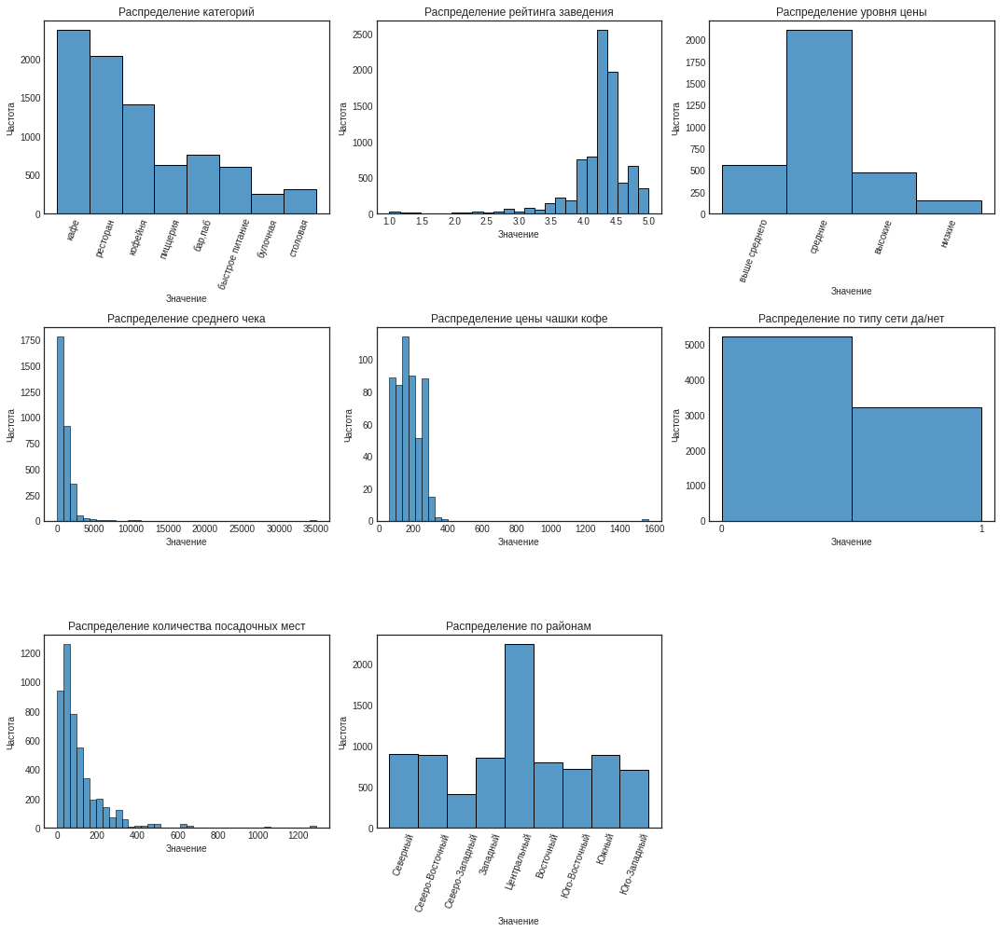

In [6]:
fig = plt.figure(figsize=(15, 14))

ax1 = plt.subplot(3, 3, 1)
sns.histplot(data['category'], bins=8)
plt.title('Распределение категорий')
plt.xlabel('Значение')
plt.ylabel('Частота')
plt.xticks(rotation=70)

ax2 = plt.subplot(3, 3, 2)
sns.histplot(data['rating'], bins=25)
plt.title('Распределение рейтинга заведения')
plt.xlabel('Значение')
plt.ylabel('Частота')

ax3 = plt.subplot(3, 3, 3)
sns.histplot(data[~data['price'].isnull()]['price'], bins=4)
plt.title('Распределение уровня цены')
plt.xlabel('Значение')
plt.ylabel('Частота')
plt.xticks(rotation=70)

ax4 = plt.subplot(3, 3, 4)
sns.histplot(data['middle_avg_bill'], bins=40)
plt.title('Распределение среднего чека')
plt.xlabel('Значение')
plt.ylabel('Частота')

ax5 = plt.subplot(3, 3, 5)
sns.histplot(data['middle_coffee_cup'], bins=40)
plt.title('Распределение цены чашки кофе')
plt.xlabel('Значение')
plt.ylabel('Частота')


ax6 = plt.subplot(3, 3, 6)
sns.histplot(data['chain'], bins=2)
plt.title('Распределение по типу сети да/нет')
plt.xlabel('Значение')
plt.ylabel('Частота')
plt.xticks(data['chain'].unique())

ax7 = plt.subplot(3, 3, 7)
sns.histplot(data['seats'], bins=40)
plt.title('Распределение количества посадочных мест')
plt.xlabel('Значение')
plt.ylabel('Частота')

ax8 = plt.subplot(3, 3, 8)
sns.histplot(data['district_ad'], bins=9)
plt.title('Распределение по районам')
plt.xlabel('Значение')
plt.ylabel('Частота')
plt.xticks(rotation=70)

plt.tight_layout()
plt.show();

 * чаще всего встречаются заведения типа кафе/ресторан/кофейня, реже всего булочная/столовая  
 * самая популярная оценка заведений около 4.3  
 * самый распростаненный ценовой уровень - средний, реже всего встречается низкий  
 * средний чек как правило до 2 тысяч рублей, есть аномально высокие значения более 10 тысяч  
 * средняя цена чашки кофе ~ до 250 рублей, также есть аномально высокие значения  
 * сетевых заведений в полтора раза меньше, чем несетевых  
 * посадочных мест, как правило, до 200, встречаются аномальные значения  
 * больше всего заведений в ЦАО, меньше всего в северо-западном.  

Подробнее изучим аномалии в столбцах `middle_avg_bill`, `middle_coffee_cup`, `seats` ниже  [обработка аномалий](#anomalies)

### Заполнение пропусков

In [7]:
#проверим пропуски
print(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
district_ad             0
dtype: int64


В данных много пропусков. Большинство связано с ценовыми параметрами

In [8]:
# проверим нулевые значения
for i in data.columns.tolist():
    print(i,len(data[data[i]==0]))

name 0
category 0
address 0
district 0
hours 0
lat 0
lng 0
rating 0
price 0
avg_bill 0
middle_avg_bill 1
middle_coffee_cup 0
chain 5201
seats 136
district_ad 0


В столбце `chain` 0 это булевы значения  
Посмотрим на нули в столбце `seats`

In [9]:
data[data['seats']==0].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0,Северо-Восточный
177,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0,Северный
196,Донер-Шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0,Северо-Восточный
203,Тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0,Северо-Восточный
211,Неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0,Северо-Восточный
266,Пекарня&Донер,булочная,"Москва, Широкая улица, 21",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887751,37.672475,4.1,NaN,NaN,NaN,NaN,0,0.0,Северо-Восточный
284,Центр Плов,кафе,"Москва, Широкая улица, 16А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887348,37.662315,4.2,NaN,NaN,NaN,NaN,0,0.0,Северо-Восточный
290,Шаурма,кафе,"Москва, Осташковская улица, 7, корп. 1",Северо-Восточный административный округ,NaN,55.877350,37.679414,3.3,NaN,NaN,NaN,NaN,0,0.0,Северо-Восточный
306,Everest Coffee,кофейня,"Москва, Сходненская улица, 50",Северо-Западный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.847770,37.440586,4.9,средние,Цена чашки капучино:200–300 ₽,NaN,250.0,0,0.0,Северо-Западный
337,Пекарня Маковка,пиццерия,"Москва, Сходненская улица, 35, корп. 1",Северо-Западный административный округ,"ежедневно, 08:00–22:00",55.848505,37.439135,4.9,NaN,NaN,NaN,NaN,0,0.0,Северо-Западный


Визуально логики нет  
Посмотрим есть ли связь с категорией заведения:

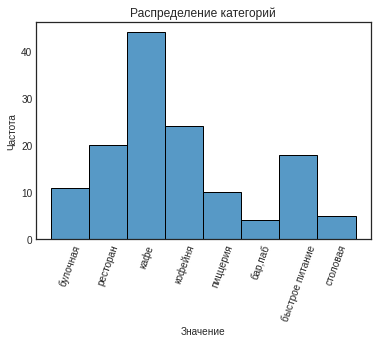

In [10]:
sns.histplot(data[data['seats']==0]['category'], bins=8)
plt.title('Распределение категорий')
plt.xlabel('Значение')
plt.ylabel('Частота')
plt.xticks(rotation=70)
plt.show();

Больше всего кафе с нулевым количеством мест  
Оставляем нули как есть, может быть это места, где нет посадочных мест, или это могут быть недозаполненные данные

Изучим подробнее пропуски, визулизируем процентное содержание относительно общего количества данных:

<a id='function'></a>

Создадим функцию для барчарта:

In [11]:
def barchart (length, height, data, x, y, palette, title, xlabel, ylabel, despinet, despiner, despinel, despineb, 
                n, horizont=True, perc_frmt=False, set_xticks=False, order=None, ylim=None, hue=None, edgecolor=None):
    # размеры
    plt.figure(figsize=(length, height))
    # график
    ax = sns.barplot(data = data, x=x, y=y, dodge=False, palette = palette, order=order, hue = hue, edgecolor=edgecolor)
    # название
    ax.axes.set_title(title, size = 20)
    # подпись ось x
    ax.set_xlabel(xlabel)
    # подпись ось y
    ax.set_ylabel(ylabel)
    # размер подпсиси
    ax.tick_params(labelsize=12) 
    # края графика
    sns.despine(top=despinet, right=despiner, left=despinel, bottom=despineb)
    
    # подписи
    #горизонтальный чарт
    if horizont==1:
        if perc_frmt==1:
            # процентная шкала
            ax.xaxis.set_major_formatter(mtick.PercentFormatter())
            # подписи данных в процентах
            for p in ax.patches:
                ax.annotate(f"{p.get_width():.{n}f}%", (p.get_width(), p.get_y()+p.get_height()/2),
                    xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=12)       
        else:
            # подписи данных не в процентах 
            for p in ax.patches:
                ax.annotate(f"{p.get_width():.{n}f}", (p.get_width(), p.get_y() + p.get_height() / 2),
                    xytext=(5, 0),textcoords='offset points', ha='left', va='center', fontsize=12)
                
    # вертикальный чарт            
    else:
        if perc_frmt==1:
            # процентная шкала
            ax.xaxis.set_major_formatter(mtick.PercentFormatter())
            # подписи данных в процентах
            for p in ax.patches:
                ax.annotate(f"{p.get_height():.{n}f}%", (p.get_x() + p.get_width() / 2, p.get_height()),
                xytext=(0, 8),textcoords='offset points', ha='center', va='center', fontsize=12)    
        else:
            # подписи данных не в процентах 
            for p in ax.patches:
                ax.annotate(f"{p.get_height():.{n}f}", (p.get_x() + p.get_width() / 2, p.get_height()),
                xytext=(0, 8),textcoords='offset points', ha='center', va='center', fontsize=12)            
    # ограничение
    ax.set_ylim(ylim)
    
    # отсутствие оси x       
    if set_xticks == 0:
        ax.set_xticks([])
    plt.show();

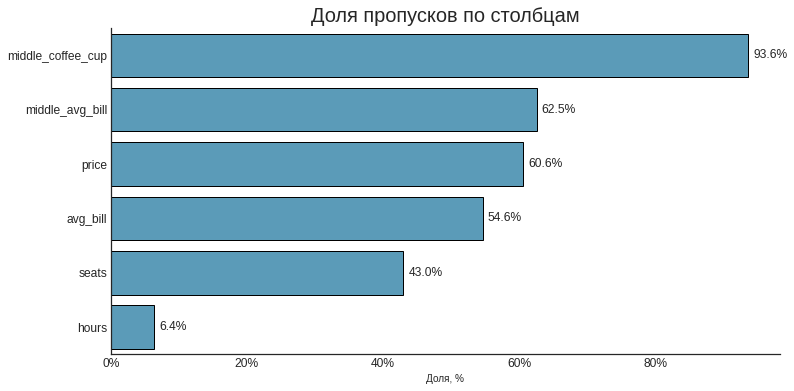

In [12]:
# создадим датафрейм с долей пропусков
gaps = (data.isna().mean()*100).to_frame(name='gaps').query('gaps > 0').sort_values(by='gaps', ascending = False)

# визуализируем
barchart (12, 6, gaps, 'gaps', gaps.index, ['#4ca1c7'], 
             'Доля пропусков по столбцам', 'Доля, %', '',1,1,0,0,1,perc_frmt=1,set_xticks=1, edgecolor='black')

Почти везде высокая доля пропусков, половина значений и выше  
Мало пропусков только в режиме работы  
Данные столбцов `hours`, `seats` заполнить нечем  
Столбцы `middle_avg_bill` и `middle_coffee_cup` зависят от содержания `avg_bill`, проверим есть ли там данные, которые не передали  
Столбец `price` должен зависеть от `middle_avg_bill`, можно это также проверить

Разберемся с `middle_avg_bill` и `middle_coffee_cup`

In [13]:
# avg_bill разделим по символу :
data[['name_bill', 'value']] = data.avg_bill.str.split(":", expand = True)

Есть ли незаполненная цена чашки кофе:

In [14]:
data[(data['name_bill']=='Цена чашки капучино')&(data['middle_coffee_cup'].isnull())]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad,name_bill,value


Все заполнено

Есть ли незаполненный средний счёт:

In [15]:
data[(data['name_bill']=='Средний счёт')&(data['middle_avg_bill'].isnull())]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad,name_bill,value


Все заполнено

In [16]:
# удалим лишние столбцы
data = data.drop(columns=['name_bill', 'value'])

Рассмотрим зависимость среднего чека и уровня цены заведения

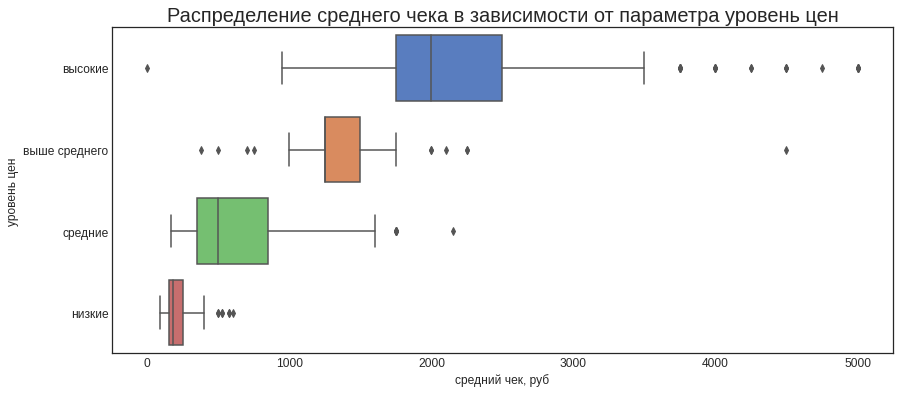

In [17]:
# порядок сортировки
order = data.groupby('price').agg({
                'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill',ascending=False).index

plt.figure(figsize=(14, 6))

# построим боксплот без явно высоких значений
ax = sns.boxplot( data=data.query('middle_avg_bill<5001'), x='middle_avg_bill', y='price', palette = 'muted', order = order)
ax.axes.set_title('Распределение среднего чека в зависимости от параметра уровень цен', size =20)
ax.set_xlabel('средний чек, руб', size =12)
ax.set_ylabel('уровень цен', size =12)
ax.tick_params(labelsize=12)

Можно заполнить пропуски в столбце price с учетом попадания значения middle_avg_bill в диапазон 25 и 75 персентиля(они не пересекаются у разных уровней price


In [18]:
# порядок заполнения
order

Index(['высокие', 'выше среднего', 'средние', 'низкие'], dtype='object', name='price')

In [19]:
# итерируемся по каждому уровню и создадим список персентителей
quintiles=[]
for o in order:
    for q in [0.25, 0.75]:
        quintiles.append(data[data['price']==o]['middle_avg_bill'].quantile(q))
display(quintiles)        

[1750.0, 2500.0, 1250.0, 1500.0, 350.0, 850.0, 150.0, 250.0]

In [20]:
# условия для заполнения столбца 
conditions = [
    (data['price'].isnull()) & (data['middle_avg_bill'] >= quintiles[0]) & (data['middle_avg_bill'] <= quintiles[1]),
    (data['price'].isnull()) & (data['middle_avg_bill'] >= quintiles[2]) & (data['middle_avg_bill'] <= quintiles[3]),
    (data['price'].isnull()) & (data['middle_avg_bill'] >= quintiles[4]) & (data['middle_avg_bill'] <= quintiles[5]),
    (data['price'].isnull()) & (data['middle_avg_bill'] >= quintiles[6]) & (data['middle_avg_bill'] <= quintiles[7])
    ]

# значения для заполнения
values = order

# заменим с использованием функции np.select()
data['price'] = np.select(conditions, values, data['price'])


Посмотрим, что получилось

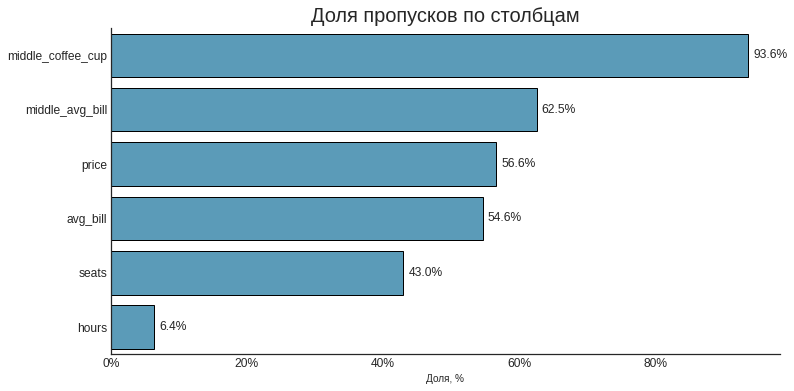

In [21]:
# создадим датафрейм с долей пропусков
gaps = (data.isna().mean()*100).to_frame(name='gaps').query('gaps > 0').sort_values(by='gaps', ascending = False)

# визуализируем
barchart (12, 6, gaps, 'gaps', gaps.index, ['#4ca1c7'], 
             'Доля пропусков по столбцам', 'Доля, %', '',1,1,0,0,1,perc_frmt=1,set_xticks=1, edgecolor='black')

Заменили 4% пропусков в столбце price  
Обратное действие (заполнять middle_avg_bill на основании rating) будет не совсем корректно, тк придется выбирать одно значение

Заменим текстовые пропуски заглушкой N/A

In [22]:
data[['hours','avg_bill', 'price']] =  data[['hours','avg_bill', 'price']].fillna('N/A')

Заменим числовые пропуски заглушкой -1

In [23]:
data = data.fillna(-1)

**В данных было много пропусков**  
 * Основные пропуски связаны с необязательными полями, которые заполняли пользователи: уровень цен, количество мест
 * Часть пропусков могла возникнуть из-за технических факторов - некорректное объединение таблиц, ошибки в БД

### Проверка дубликатов

In [24]:
#проверим дубликаты
display(data[data.duplicated()])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad


Явных дубликатов не обнаружено  
Проверим неявные дубликаты в названиях:

In [25]:
print(data['name'].sort_values().unique().tolist())

['#КешбэкКафе', '+39 Pizzeria Mozzarella bar', '1 Этаж', '1-я Креветочная', '10 Идеальных Пицц', '1001 Ночь', '100ловая', '100лоффка', '13', '13 Chef doner', '15 Kitchen+Bar', '15-й Шар', '16 Июня', '16 Тонн', '18 Грамм', '1901 Comfort Food Zone', '1у', '2 Типа', '2-й Этаж', '2046', '21 Век', '22 Акра Кофе&Хлеб', '2U-Ту-Ю', '3 Ступени', '351 Bar', '4 Сезона', '4.2. Bar', '4/1 Restaurant', '42 Coffee Shop', '47', '495', '4friends Coffee', '4tuna Cafe&Grill', '5 Stars Coffee', '55.709201, 37.392257', '6 Am Bread Kitchen', '6 Рукопожатий', '69 раков', '7 Сэндвичей', '7 элемент', '7/12', '8 Oz', '8 Вафель', '8 Зёрен', '8 Пончиков', '800°с Contemporary Steak', '8bit Pizza', '9 Bar Coffe', '9 Bar Coffee', '9 Зёрен', 'A-cafe', 'ABC Coffee Roasters', 'ABC coffee roasters', 'Acai Family', 'Accent', "Adam's Chicken", 'Adria Mare', 'Ahava', 'Air Coffee', 'Al Halal', 'Al33 Пиццерия бар Боттега', 'All Day', 'Alma', 'Alternative coffee', 'Aly’s Poke', 'Amande', 'Amarena', 'Americano Black Coffee & F

Присутствую одинаковые названия, написанные в разном регистре, названия, где встречаются различия в дефисах, пробелах, апострофах, приведем их к одному виду:

In [26]:
data = data.replace({'name': {"9 Bar Coffe":"9 Bar Coffee", "ABC coffee roasters": "ABC Coffee Roasters", "Bb grill": "Bb Grill", "Bfl’s": "BFL’S", 
                              "Burger club": "Burger Club", "Cafe13": "Cafe 13", "Carrots and beans": "Carrots and Beans", 
                              "CofeFest": "Cofe Fest", "Coffee point": "Coffee Point", 
                              "Corner cafe&kitchen": "Corner cafe & kitchen", "Deli2go": "Deli2Go", 
                              "Di villaggio": "Di Villaggio", "Espresso bar": "Espresso Bar", "Festa&Тесто": "Festa & Тесто", 
                              "Flip": "FLIP", "Han cook": "Han Cook", "Hellopapaya": "HelloPapaya", 
                              "I like wine": "I Like Wine", "IL pizzaiolo": "IL Pizzaiolo", "Istanbul kebab": "Istanbul Kebab", 
                              "It's СоТ-Кофейня": "It's СоТ - Кофейня", "Korean chick": "Korean Chick", 
                              "Ku: рамен изакая бар": "Ku: Рамен Изакая бар", "MainFood": "Main Food", "MeatЛав": "Meat Лав", 
                              "More poke": "More Poke", "Noba coffee": "Noba Coffee", "Nova bubble tea": "Nova Bubble Tea", 
                              "One price coffee": "One Price Coffee", "One&double": "One&Double", 
                              "Pasta cup & pizza": "Pasta Cup & Pizza", "Pho street": "Pho Street", "PhoBo": "Pho Bo", 
                              "Phou": "Pho U", "Pinzeria by Bontempi": "PiNzeria by Bontempi", "Poke house": "Poke House", 
                              "Pomodoro royal": "Pomodoro Royal", "Raw to go": "Raw to Go", "Sedelice": "SeDelice", 
                              "ShakeUp": "Shake up", "Sova coffee": "Sova Coffee", "Star hit cafe": "Star Hit Cafe", 
                              "The Wild Bean Cafe": "Wild Bean Cafe", "The wild bean cafe": "Wild Bean Cafe", 
                              "Vabene": "VABENE", "Wave california poke": "Wave California Poke", 
                              "Wild bean cafe": "Wild Bean Cafe", "Авлабар": "АвлаБар", "Ача-чача": "Ача-Чача", 
                              "Важная персона": "Важная Персона", "Вкусвилл, кафе": "ВкусВилл, кафе", 
                              "Вьет лотос": "Вьет Лотос", "Гастроферма": "ГастроФерма", "Греки здесь": "Греки Здесь", 
                              "Гюмри хауз": "Гюмри Хауз", "Даблби": "ДаблБи", "Домик в саду": "Домик в Саду", 
                              "Домино'с": "Домино'с Пицца", "Домино'с пицца": "Домино'с Пицца", 
                              "Доминос пицца": "Домино'с Пицца", "Ели сацебели": "Ели Сацебели", 
                              "Есть Хинкали&Пить Вино": "Есть Хинкали & Пить Вино", "Кофе&Moloko": "Кофе & Moloko", 
                              "Кофеin": "КофеIN", "Крошка картошка": "Крошка Картошка", "Кружкапаб": "Кружка Паб", 
                              'Кулинарная лавка братьев Караваевых': 'Кулинарная лавка б. Караваевых',
                              "Лепим и варим": "Лепим и Варим", "Ливан хаус": "Ливан Хаус", "Ля фантази": "Ля Фантази", 
                              "МА Ми": "Ма Ми", "Между булок": "Между Булок", "МСК lounge": "МСК Lounge", 
                              "Новатор кофе": "Новатор Кофе", "Нэм нэм": "Нэм Нэм", "Ням-ням": "Ням-Ням", "Папан": "ПаПан", 
                              "Пирог хауз": "Пирог Хауз", "Правда кофе": "Правда Кофе", "Практика кофе": "Практика Кофе", 
                              "Раковарня Клешни и хвосты": "Раковарня Клешни и Хвосты", "Рамен-клаб": "Рамен-Клаб", 
                              "Рэдимэйд": "РэдиМэйд", "Ситипицца": "Сити Пицца", "Сушисет": "Суши Сет", 
                              "СушиСтор": "Суши Стор", "Токио рамен": "Токио Рамен", "Франклинс бургер": "Франклинс Бургер", 
                              "Халва, сеть почтоматов": "Халва, Сеть Почтоматов", "Хинкали point": "Хинкали Point", 
                              "Хинкали - Gали!": "Хинкали - Gали!", "Хинкали Gали": "Хинкали - Gали!", 
                              "Хинкали Gали!": "Хинкали - Gали!", "Хинкали-Gaли": "Хинкали - Gали!", 
                              "Хинкали-Gали": "Хинкали - Gали!", "Хинкали-Gали!": "Хинкали - Gали!",
                              "Хинкальная экспресс": "Хинкальная Экспресс", "Хлеб да выпечка": "Хлеб да Выпечка", 
                              "Хлеб насущный": "Хлеб Насущный", "Хлеб Насущный экспресс": "Хлеб Насущный Экспресс", 
                              "Хочу хычин": "Хочу Хычин", "Чайхана Бишкек сити": "Чайхана Бишкек Сити", 
                              "Чайхана Халал": "Чайхана Халаль", "Чайхана халяль": "Чайхана Халяль", 
                              "Чайхана24": "Чайхана 24", "Чайхона №1": "Чайхона № 1", "Чайхона Ош сити": "Чайхона ОШ Сити", 
                              "Яндекс.Лавка": "Яндекс Лавка"

}})

In [27]:
print(data['name'].sort_values().unique().tolist())

['#КешбэкКафе', '+39 Pizzeria Mozzarella bar', '1 Этаж', '1-я Креветочная', '10 Идеальных Пицц', '1001 Ночь', '100ловая', '100лоффка', '13', '13 Chef doner', '15 Kitchen+Bar', '15-й Шар', '16 Июня', '16 Тонн', '18 Грамм', '1901 Comfort Food Zone', '1у', '2 Типа', '2-й Этаж', '2046', '21 Век', '22 Акра Кофе&Хлеб', '2U-Ту-Ю', '3 Ступени', '351 Bar', '4 Сезона', '4.2. Bar', '4/1 Restaurant', '42 Coffee Shop', '47', '495', '4friends Coffee', '4tuna Cafe&Grill', '5 Stars Coffee', '55.709201, 37.392257', '6 Am Bread Kitchen', '6 Рукопожатий', '69 раков', '7 Сэндвичей', '7 элемент', '7/12', '8 Oz', '8 Вафель', '8 Зёрен', '8 Пончиков', '800°с Contemporary Steak', '8bit Pizza', '9 Bar Coffee', '9 Зёрен', 'A-cafe', 'ABC Coffee Roasters', 'Acai Family', 'Accent', "Adam's Chicken", 'Adria Mare', 'Ahava', 'Air Coffee', 'Al Halal', 'Al33 Пиццерия бар Боттега', 'All Day', 'Alma', 'Alternative coffee', 'Aly’s Poke', 'Amande', 'Amarena', 'Americano Black Coffee & Food', 'Amg cafe', 'Ami Chaise', 'Amore

Проверим дубликаты по сцепке название адрес

In [28]:
display(data[data[['name', 'address']].duplicated(keep=False)])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad
416,Чайхана Халаль,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860894,37.482553,4.3,N/A,N/A,-1.0,-1.0,0,53.0,Северный
450,Чайхана Халаль,ресторан,"Москва, Смольная улица, 24Г, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.860892,37.482538,4.3,N/A,N/A,-1.0,-1.0,1,53.0,Северный
1430,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,N/A,N/A,-1.0,-1.0,0,188.0,Северный
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,N/A,N/A,-1.0,-1.0,1,188.0,Северный
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,N/A,N/A,-1.0,-1.0,0,150.0,Северо-Восточный
2420,Раковарня Клешни и Хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,N/A,N/A,-1.0,-1.0,1,150.0,Северо-Восточный
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,N/A,N/A,-1.0,-1.0,1,276.0,Западный
3109,Хлеб да Выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,N/A,55.738449,37.410937,4.1,N/A,N/A,-1.0,-1.0,0,276.0,Западный
4613,Cafe 13,кафе,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–19:00,55.762779,37.633079,4.3,N/A,N/A,-1.0,-1.0,0,200.0,Центральный
4780,Cafe 13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.762748,37.633176,4.3,N/A,N/A,-1.0,-1.0,0,200.0,Центральный


Похоже на дубликаты - одинаковый рейтинг, одинаковое количество посадочных мест

In [29]:
data_filt = data.drop_duplicates(subset=['name', 'address']).reset_index(drop=True)

In [30]:
print('Удалено', len(data)-len(data_filt), 'повторяющихся строк из', len(
                        data), ',что составляет:{:.2f}% датасета'.format((len(data)-len(data_filt))*100/len(data)))

Удалено 5 повторяющихся строк из 8406 ,что составляет:0.06% датасета


В данных присутствовали неявные дубликаты в количестве 0.06% датасета, были удалены

<a id='anomalies'></a>

### Обработка аномалий

Изучим аномальные значения в столбцах `middle_avg_bill`, `middle_coffee_cup`, `seats`

In [31]:
# средний чек
an_avb = data_filt[data_filt['middle_avg_bill']>10000]
an_avb

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad
729,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,-1.0,0,49.0,Северный
7172,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,-1.0,0,100.0,Южный


Подозрительная Чойхона с опечаткой и кафе под названием кафе :)  
Возможно лишний ноль в цене, но проще удалить эти строки

In [32]:
data_filt = data_filt[data_filt['middle_avg_bill']<10000]

In [33]:
# чашка кофе
an_avc = data_filt[data_filt['middle_coffee_cup']>500]
an_avc

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad
2856,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,-1.0,1568.0,1,48.0,Восточный


Удалим строку

In [34]:
data_filt = data_filt[data_filt['middle_coffee_cup']<500]

Проверим количество мест

In [35]:
an_avs = data_filt[data_filt['seats']>590].sort_values(by='seats')
an_avs

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,district_ad
6153,Мармелад,кафе,"Москва, улица Гарибальди, 1А",Юго-Западный административный округ,"ежедневно, 11:00–23:00",55.678533,37.532971,4.1,выше среднего,Средний счёт:1000–1500 ₽,1250.0,-1.0,0,600.0,Юго-Западный
1325,Нам,"бар,паб","Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 11:00–21:00",55.803236,37.517898,4.2,N/A,N/A,-1.0,-1.0,1,625.0,Северный
2102,Ванильное небо,кофейня,"Москва, Ленинградский проспект, 31А, стр. 1",Северный административный округ,пн-пт 08:00–20:00; сб 09:00–18:00,55.784066,37.559398,3.7,средние,Средний счёт:400 ₽,400.0,-1.0,1,625.0,Северный
2085,Лобби-бар Манжо,"бар,паб","Москва, Ленинградский проспект, 31А, стр. 1",Северный административный округ,пн-пт 08:30–20:00,55.783622,37.559943,4.0,средние,Средний счёт:500 ₽,500.0,-1.0,0,625.0,Северный
2033,Столичный вкус,столовая,"Москва, Ленинградский проспект, 35, стр. 1",Северный административный округ,пн-пт 09:00–17:00,55.789750,37.552723,4.1,N/A,N/A,-1.0,-1.0,1,625.0,Северный
2008,Coffeeteabar,кофейня,"Москва, Ленинградский проспект, 60, корп. 1",Северный административный округ,пн-пт 07:30–20:30; сб 07:30–19:30; вс 08:30–19:30,55.799751,37.535100,4.4,низкие,Цена чашки капучино:150–210 ₽,-1.0,180.0,0,625.0,Северный
1878,Чайхона Айва,кафе,"Москва, Ленинградский проспект, 45, корп. 1",Северный административный округ,"ежедневно, круглосуточно",55.798882,37.533990,4.3,N/A,N/A,-1.0,-1.0,1,625.0,Северный
1865,VASILCHUKÍ Chaihona №1,ресторан,"Москва, Ленинградский проспект, 31А, стр. 1",Северный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–01:00; вс 11:00...",55.783590,37.560170,4.3,выше среднего,Средний счёт:от 1500 ₽,1500.0,-1.0,1,625.0,Северный
1836,Take and Wake,кофейня,"Москва, Ленинградский проспект, 31А, стр. 1",Северный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–19:00",55.783494,37.559933,4.5,N/A,Цена чашки капучино:120–190 ₽,-1.0,155.0,1,625.0,Северный
1764,Золотая Бухара,ресторан,"Москва, Ленинградский проспект, 48, подъезд 1",Северный административный округ,"ежедневно, 12:00–23:00",55.796294,37.542917,4.4,N/A,N/A,-1.0,-1.0,0,625.0,Северный


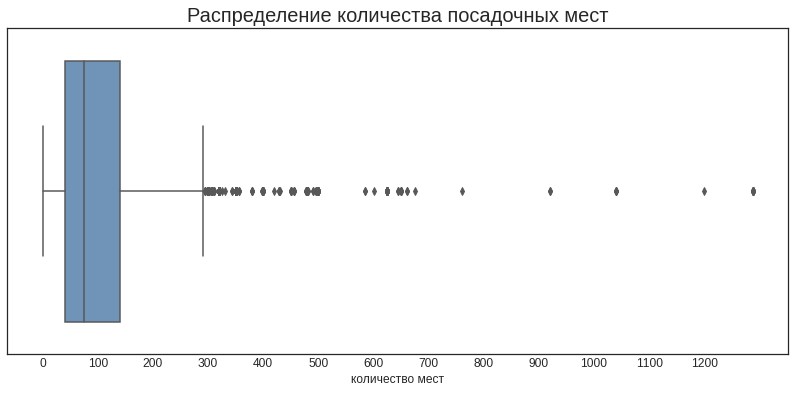

In [36]:
# пострим боксплот 
plt.figure(figsize=(14, 6))

ax = sns.boxplot( data=data_filt[data_filt['seats']>=0], x='seats', color='#6395c3')
ax.axes.set_title('Распределение количества посадочных мест', size =20)
ax.set_xlabel('количество мест', size =12)
ax.tick_params(labelsize=12)
plt.xticks(np.arange(0, data_filt['seats'].max()+1, 100));

Количество мест больше 550 совсем редкие  
Избранный гуглеж показал, что в некоторых заведениях точно нет такого количичества мест  
На общие закономерности они не повлияют, поэтому заменим посадочные места больше 550 заглушкой -1

In [37]:
data_filt['seats'] = np.where(data_filt['seats']>550, -1, data_filt['seats'])

In [38]:
print('В данных было обнаружено {:.2f}% строк с аномальными значениями,'.
      format((len(an_avb)+len(an_avc)+len(an_avs))*100/len(data)), 
      'из них заменили заглушкой {:.2f}% строк,'.format((len(an_avs))*100/len(data)),'остальное удалили')

В данных было обнаружено 0.68% строк с аномальными значениями, из них заменили заглушкой 0.64% строк, остальное удалили


Проверим принадлежность к сети заведений с одинаковым названием

In [39]:
chain = data_filt.pivot_table(
    index='name', columns='chain',values='address',aggfunc='count')
chain.columns = ['non_chain','chain']
chain = chain.sort_values(by='chain', ascending=False)
chain = chain[(chain['non_chain']>0)&(chain['chain']>0)]
chain

,non_chain,chain
name,,
Домино'с Пицца,3.0,76.0
One Price Coffee,1.0,71.0
Cofe Fest,1.0,32.0
Суши Стор,1.0,16.0
МСК Lounge,1.0,14.0
Хинкали - Gали!,4.0,9.0
Франклинс Бургер,1.0,8.0
Сити Пицца,1.0,7.0
9 Bar Coffee,1.0,7.0


Микросети на статистику не повлияют, крупные можно подправить  
Заменим признак 0 на 1 в сетях  с кол-вом точек более 5

In [40]:
# список сетей
chain_name = chain[chain['chain']>5].index.tolist()
# замена
data_filt['chain'] = np.where(data_filt['name'].isin(chain_name), 1, data_filt['chain']) 

### Преобразование форматов

Преобразуем столбец `chain` в булев тип, `seats` в целочисленный:

In [41]:
data_filt = data_filt.astype({ "chain": "bool", "seats": "int"})

### Добавление данных

Вставим столбец street с названиями улиц из столбца с адресом.

In [42]:
# data_filt.insert(3, 'street', data_filt.address.str.split(",", 2).str[1])

In [43]:
data_filt['street'] = data_filt.address.str.split(",", 2).str[1]

Вставим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [44]:
data_filt.insert(6, 'is_24/7', data_filt['hours'].str.contains('ежедневно, круглосуточно', na=False))

Зафиксируем цвета для графиков:

In [45]:
# категории
palette = ['#8dd3c7','#bebada','#fb8072','#ffffb3','#80b1d3','#fdc688','#fccde5','#d9d9d9']
colors = {'кафе': palette[0], 
          'ресторан':palette[1], 
          'кофейня': palette[2], 
          'бар,паб': palette[3], 
          'пиццерия': palette[4],
          'быстрое питание': palette[5],
          'столовая': palette[6],
          'булочная': palette[7]}
#fdc688
# сети
palette2 = ['#ffe46a','#7fcec0']
colors2 = {'chain': palette2[0], 
          'non_chain':palette2[1]}

# рейтинг
palette3 = ['#d73f27','#fdae61','#a6d96a','#1a9641']

**Вывод**  
Были обнаружены аномальные значения в данных в количестве 0,7% строк датасета, большую часть заменили заглушкой.  
Было много пропусков, в основном за счет полей, заполняемых пользователем. Основные пропуски связяны с параметрами цены.  
Большую часть пропусков заменили загушкой.  
Обнаружены и удалены неявные дубликаты в количестве 0.17% строк

## Исследовательский анализ данных

**Изучим количество объектов общественного питания по категориям**

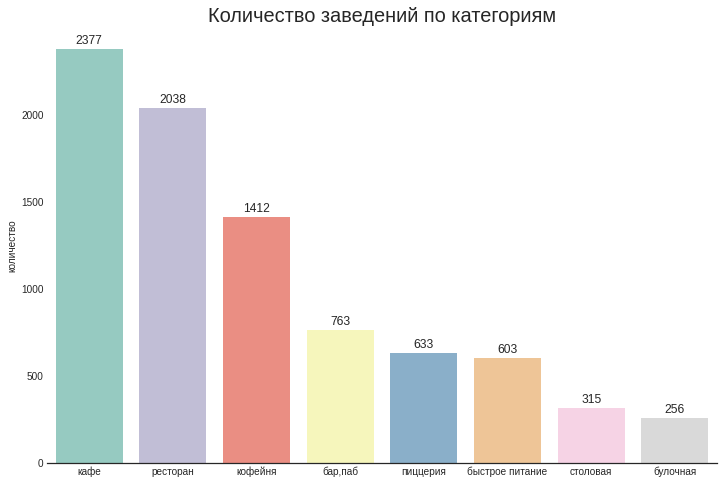

In [46]:
# визуализируем
plt.figure(figsize=(12, 8))
ax = sns.countplot(x=data_filt['category'], order=data_filt['category'].value_counts().index, palette = colors)
ax.axes.set_title('Количество заведений по категориям', size =20)
ax.set_xlabel('')
ax.set_ylabel('количество')
ax.tick_params(labelsize=10)
sns.despine(top=1, right=1, left=1, bottom=0)

# создадим подписи данных
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2, p.get_height()),
                xytext=(0, 8),textcoords='offset points', ha='center', va='center', fontsize=12);

Самые распространенные категории заведений - это кафе и рестораны, далее идут кофейни с небольшим отрывом  
Меньше всего столовых и булочных

**Рассмотрим распределение количества посадочных мест в зависимости от категории заведения:**

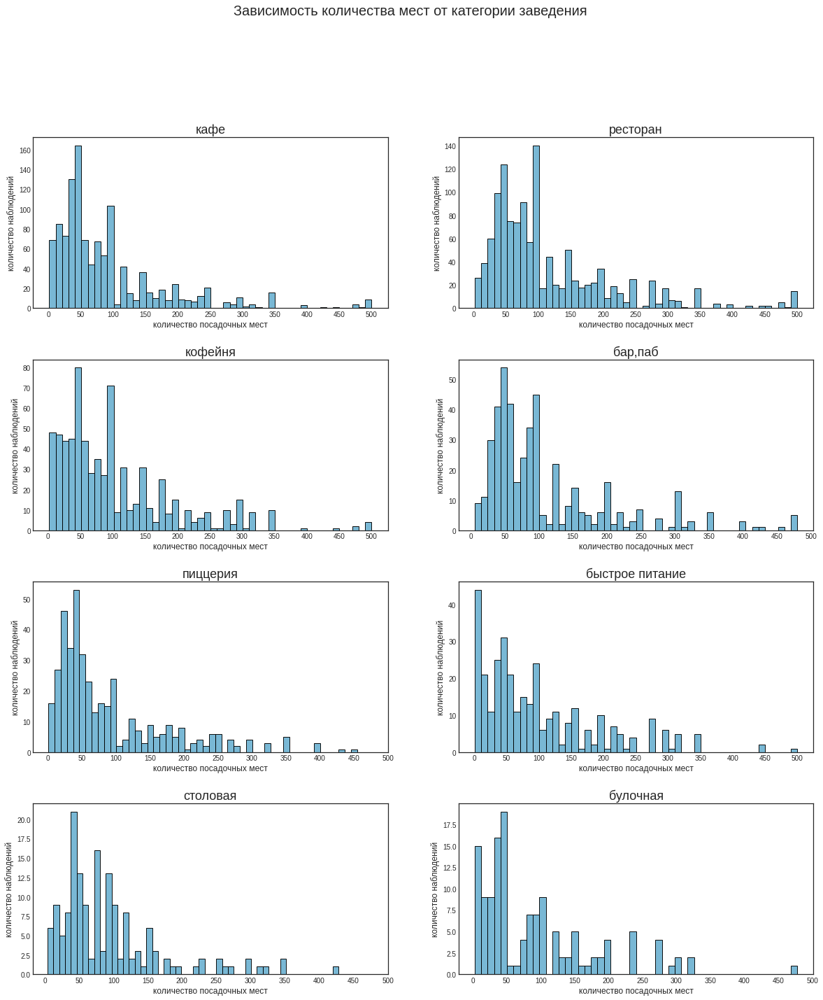

In [47]:
category = data_filt['category'].value_counts().index
title = data_filt['category'].value_counts().index
plt.figure(figsize = (20,22))
title_set = 0
seria = 1
plt.subplots_adjust(hspace = 0.3)
    
for c in category:
    ax = plt.subplot(4,2,seria)
    sns.histplot(data_filt[(data_filt['category']==c)&(data_filt['seats']>0)]['seats'], bins=50,ax = ax, color = '#4ca1c7')
    plt.suptitle('Зависимость количества мест от категории заведения', y =1,fontsize = 20)
    plt.ylabel("количество наблюдений",size = 12)
    plt.xlabel("количество посадочных мест",size = 12)
    plt.xticks(np.arange(0, data_filt['seats'].max()+1, 50))
    plt.title(title[title_set], size =18);
    seria +=1
    title_set +=1

In [48]:
print('Медианное количество мест:')
for c in category:
    for q in [0.5]:
        print(c, data_filt[(data_filt['category']==c)&(data_filt['seats']>0)]['seats'].quantile(q))



Медианное количество мест:
кафе 60.0
ресторан 87.0
кофейня 80.0
бар,паб 80.0
пиццерия 55.0
быстрое питание 75.0
столовая 76.0
булочная 51.0


Как правило, в заведениях до 100 посадочных мест.  
Реже встречается от 100 до 300 посадочных мест.  
Меньше всего посадочных мест в булочных и пиццериях - до 50  

**Рассмотрим соотношений сетевых заведений**

Напишем функцию для визуализации чарта типа донат:

In [49]:
def donat (length, height, data, colors, n, title, labels, counterclock=True):
    # размер
    plt.figure(figsize=(length, height))
    # строим пирог
    plt.pie(data, colors=colors, startangle=90,counterclock=counterclock, autopct=lambda p:f'{p:.{n}f}%', textprops={'fontsize': 12}, pctdistance=0.85,
            explode=(0.03, 0.03))
    # центр
    centre_circle = plt.Circle((0, 0), 0.60, fc='white')
    fig = plt.gcf()
    # добавляем центр
    fig.gca().add_artist(centre_circle)
    # название
    plt.title(title, size =18)
    # легенда
    plt.legend(labels=labels, bbox_to_anchor=(1, 0.95), loc='upper left')
    plt.show()

Доля сетевых заведений в целом:

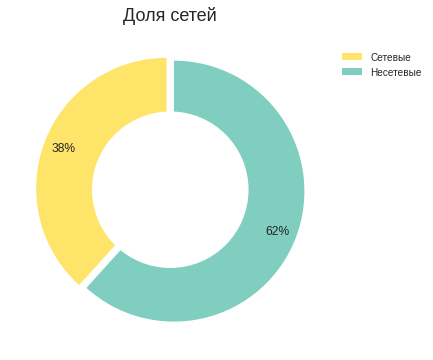

In [50]:
# подсчет значений
chain_donat = [len(data_filt[data_filt['chain']==1]), len(data_filt[data_filt['chain']==0])]

# визуализируем
donat (6, 6, chain_donat, palette2, 0, 'Доля сетей', ['Сетевые','Несетевые'])

По категориям:

In [51]:
chain_plot = data_filt.groupby('category').agg({'chain': 'mean'})
chain_plot['chain'] = chain_plot['chain']*100
chain_plot['non_chain'] = 100-chain_plot['chain']
chain_plot = chain_plot.sort_values(by='chain')
chain_plot

,chain,non_chain
category,,
"бар,паб",22.149410,77.850590
столовая,27.936508,72.063492
кафе,32.982751,67.017249
ресторан,35.819431,64.180569
быстрое питание,38.474295,61.525705
кофейня,51.133144,48.866856
пиццерия,52.764613,47.235387
булочная,61.328125,38.671875


Напишем функцию для визуализации горизонтальной столбчатой диаграммы:

In [52]:
def barh (data, length, height, palette, title, xlabel, ylabel, despinet, despiner, despinel, despineb, 
            n, perc_frmt=False, set_xticks=False, legend=False, legend_text=[], stacked=True, width = 0.75):
    # график
    ax = data.plot(figsize=(length, height), color = palette, kind='barh', stacked=stacked, width = width)
    # название
    ax.axes.set_title(title, size = 20)
    # подпись ось x
    ax.set_xlabel(xlabel)
    # подпись ось y
    ax.set_ylabel(ylabel)
    # легенда
    if legend==1:
        plt.legend(labels=legend_text, bbox_to_anchor=(1, 1), loc='best')
    # размер подпсиси
    ax.tick_params(labelsize=12) 
    # края графика
    sns.despine(top=despinet, right=despiner, left=despinel, bottom=despineb)

    if perc_frmt==1:
        # процентная шкала
        ax.xaxis.set_major_formatter(mtick.PercentFormatter())
        # подписи данных в процентах
        for p in ax.patches:
            if p.get_width()>0:
                label_text = f"{p.get_width():.{n}f}%"
            else:
                label_text = ''
        
            label_x = p.get_x() + p.get_width() / 2
            label_y = p.get_y() + p.get_height() / 2
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=10)       
    else:
        # подписи данных не в процентах 
        for p in ax.patches:
            if p.get_width()>0:
                label_text = f"{p.get_width():.{n}f}"
            else:
                label_text = ''
        
            label_x = p.get_x() + p.get_width() / 2
            label_y = p.get_y() + p.get_height() / 2
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=10)
    
    # отсутствие оси x       
    if set_xticks == 0:
        ax.set_xticks([])
    plt.show();
    

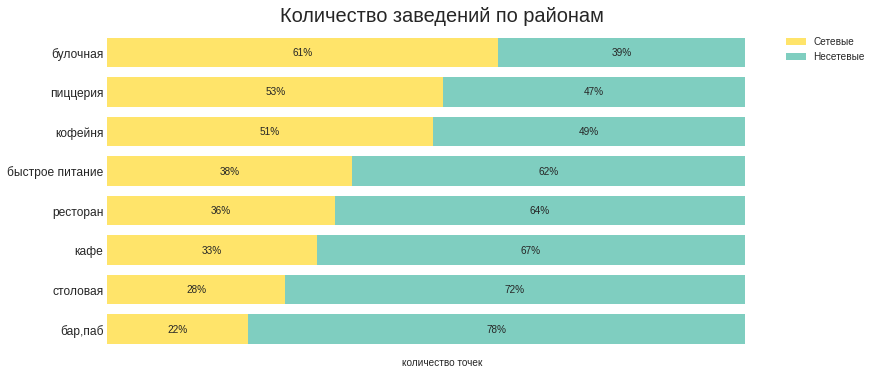

In [53]:
# визуализируем сетевые заведения по категориям
barh (chain_plot, 12, 6, colors2, 'Количество заведений по районам', 'количество точек', '', 
                                                            1, 1, 1, 1, 0, 1, legend=1, legend_text=['Сетевые','Несетевые'])

Общая доля сетевых заведений в датасете 38%  
Чаще всего сетевыми являются булочные - 61%, пиццерии, кофейни - 50%  
Реже всего встречаются сетевые бары - 22%

**Рассмотрим топ15 популярных сетей Москвы**

In [54]:
top15 = data_filt[data_filt['chain']==1].groupby(
            ['name']).agg({'address':'count'}).sort_values(by='address', ascending=False).head(15)
top15

,address
name,
Шоколадница,119
Домино'с Пицца,79
Додо Пицца,74
Яндекс Лавка,72
One Price Coffee,72
Cofix,65
Prime,50
Хинкальная,44
КОФЕПОРТ,42


**Примечание**  
*Далее я столкнулась с дилеммой, тк у некоторых сетей разные категории.  
В основном расхождений мало - 1-2 заведения выбивается из общей массы. Но, например Му-Му встречается и в кафе и  ресторанах и в пиццериях.  
Я решила присвоить сети один вид категории исходя из той, которая встречается чаще. Если у сети одно назвние, то как правило и формат одинаковый. Тоже Му-Му, например, это сеть кафе и позиционируется как кафе.  
Можно построить визуализации с учетом принадлежности одной сети к разным категориям,но внимаение рассеивается от сути  
Либо можно стразу рассматривать количество точек с учетом категории, но тогда вылетает Му-Му.  
Но на общий вывод примерно одинаков, тк сверху рулят кофейни и пиццерии*

In [55]:
# создадим таблицу, где одному названию будет присовена одна категория заведедения(где больше всего точек)
category = data_filt.groupby(['name','category'], as_index=False).agg(
                            {'address':'count'}).sort_values(by=['name', 'address']).reset_index(drop=True).groupby(
                                                                                    ['name']).agg({'category': 'last'})

In [56]:
top15 = top15.join(category)
top15

,address,category
name,,
Шоколадница,119,кофейня
Домино'с Пицца,79,пиццерия
Додо Пицца,74,пиццерия
Яндекс Лавка,72,ресторан
One Price Coffee,72,кофейня
Cofix,65,кофейня
Prime,50,ресторан
Хинкальная,44,кафе
КОФЕПОРТ,42,кофейня


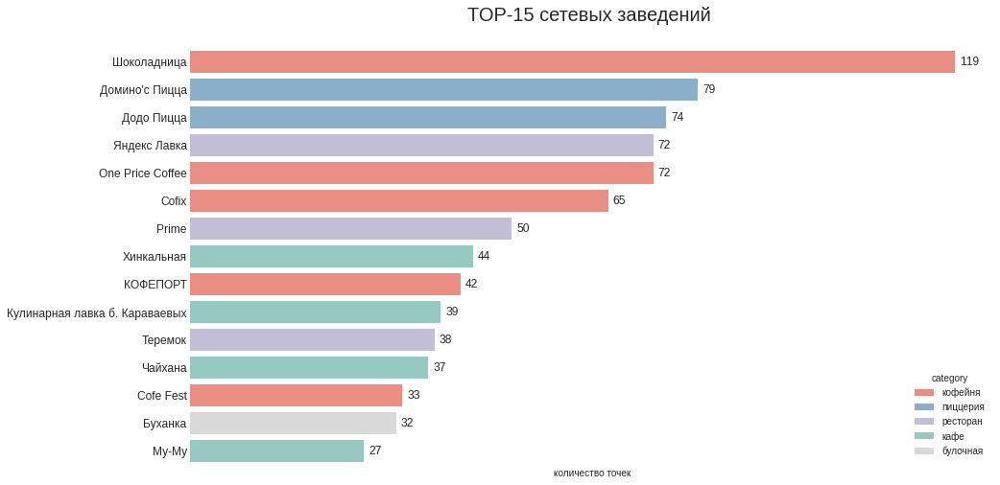

In [57]:
# визуализируем
barchart (15, 8, top15, 'address', top15.index, colors, 
             'TOP-15 сетевых заведений \n ', 'количество точек', '',1,1,1,1,0, hue = 'category')

Самые популярные сетевые заведения кофейни и пиццерии  
Реже встречаются кафе    
Рестораны в топе присутствуют условно, тк Яндекс Лавка - это доставка, Теремок ближе в быстрому питанию, Prime  ближе к кафе

**Рассмотрим распределение заведений по районам**

In [58]:
districts = data_filt.pivot_table(
    index='district_ad', columns='category',values='address',aggfunc='count')
districts['total'] = districts.sum(axis = 1)
districts = districts.sort_values(by='total', ascending=False)
display(districts)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district_ad,,,,,,,,,
Центральный,364,50,87,464,428,113,669,66,2241
Северный,67,39,58,235,193,77,187,41,897
Южный,68,25,85,264,131,73,201,44,891
Северо-Восточный,62,28,82,269,159,68,182,40,890
Западный,50,37,62,238,150,71,218,24,850
Восточный,53,25,71,272,104,72,159,40,796
Юго-Восточный,38,13,67,282,89,55,145,25,714
Юго-Западный,38,27,61,238,96,64,168,17,709
Северо-Западный,23,12,30,115,62,40,109,18,409


Напишем функцию для визуализации горизонтальной столбчатой диаграммы:

Визуализируем типы заведений по райнонам

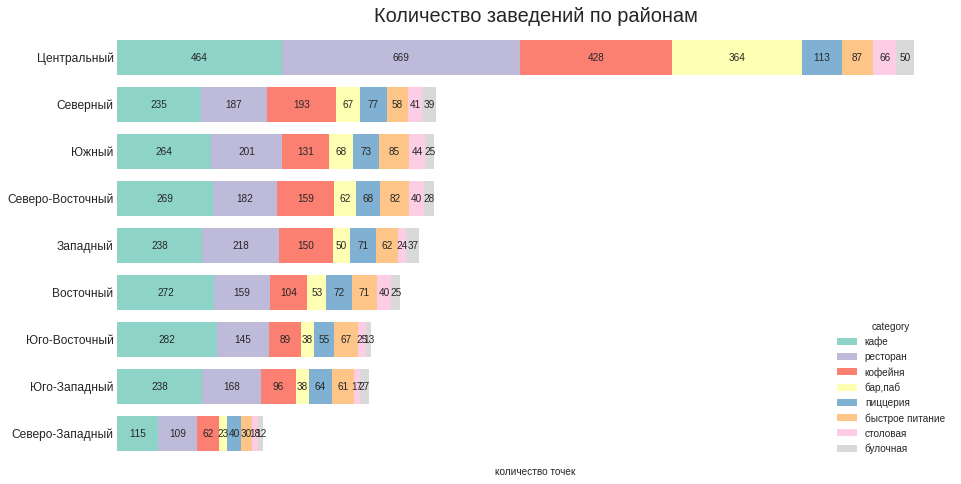

In [59]:
# подготовим таблицу для графика
districts_plot = districts.sort_values(by='total')
districts_plot = districts_plot.loc[:,districts.columns != 'total']

# порядок колонок
cols = data_filt['category'].value_counts().index
# поменяем колонки местами
districts_plot = districts_plot[cols]

# визуализируем
barh (districts_plot, 15, 8, colors, 'Количество заведений по районам', 'количество точек', '', 1, 1, 1, 1, 0)

С большим отрывом по количеству заведений лидирует Центральный район ~ 2200 точек  
Меньше всего в Северо-Западном районе - 400  
В остальных 700-900  
Бары и рестораны максимально сосредоточены в Центральном районе  
Булочные, быстрое питание, пиццерии и кафе, наоборот, встречаются в центре реже  
Кофейни равномерно распределены по большинству районов

**Посмотрим на распределение усредненных рейтингов по категориям заведений**

In [60]:
rating = data_filt.groupby(['category']).agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False)
display(rating)
print('Средний рейтинг заведений {:.2f}'.format(data_filt['rating'].mean()))
print('Медианный рейтинг заведений {:.2f}'.format(data_filt['rating'].median()))

,rating
category,
"бар,паб",4.39
пиццерия,4.30
ресторан,4.29
кофейня,4.28
булочная,4.27
столовая,4.21
кафе,4.12
быстрое питание,4.05


Средний рейтинг заведений 4.23
Медианный рейтинг заведений 4.30


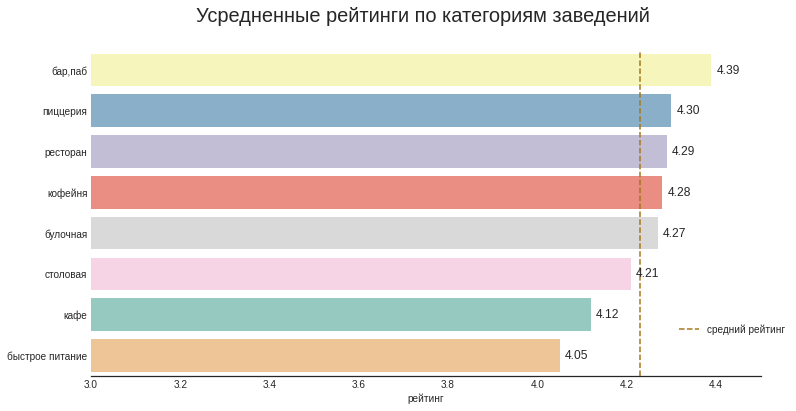

In [61]:
# визуализируем
plt.figure(figsize=(12, 6))
ax = sns.barplot(data = rating, x='rating', y=rating.index, dodge=False, palette = colors)
ax.axes.set_title('Усредненные рейтинги по категориям заведений \n ', size =20)
ax.set_xlabel('рейтинг')
ax.set_ylabel('')
plt.xlim(3, 4.5)
ax.tick_params(labelsize=10)
sns.despine(top=True, right=True, left=True, bottom=False)

# средний рейтинг заведений
ax.axvline(x=data_filt['rating'].mean(), color='#a6761d',linestyle='dashed', label='средний рейтинг')
plt.legend(bbox_to_anchor=(1.05, 0.1), loc='lower right')

# создадим подписи данных
for p in ax.patches:
    ax.annotate(format(p.get_width(), '.2f'), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=12);

Средние рейтинги по категориям различаются слабо, большинство категорий имеют рейтинг около 4.30  
Выше у баров - 4.4  
Ниже у кафе и быстрого питания - 4.1  
Примечательно, что у столовых рейтинг выше, чем у кафе. Возможно от них не ждут многого)

**Посмотрим на распределение усредненных рейтингов по районам**

In [62]:
rating_d = data_filt.groupby(
            ['district']).agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False)
rating_d

,rating
district,
Центральный административный округ,4.38
Северный административный округ,4.24
Северо-Западный административный округ,4.21
Западный административный округ,4.18
Южный административный округ,4.18
Восточный административный округ,4.17
Юго-Западный административный округ,4.17
Северо-Восточный административный округ,4.15
Юго-Восточный административный округ,4.10


Визуализируем рейтинги на карте

In [63]:
# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = '/datasets/admin_level_geomap.geojson'
except:
    state_geo = 'https://code.s3.yandex.net//datasets/admin_level_geomap.geojson'
#state_geo = 'https://code.s3.yandex.net//datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_d,
    columns=[rating_d.index, 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые рейтинговые заведения расположены в Центральном и в Северо-Западном округах

**Посмотрим на связь уровня цен и рейтинга заведений**

In [64]:
rating_price = data_filt[data_filt['price']!='N/A'].groupby(
            ['price']).agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False)
rating_price

,rating
price,
высокие,4.44
выше среднего,4.38
средние,4.29
низкие,4.12


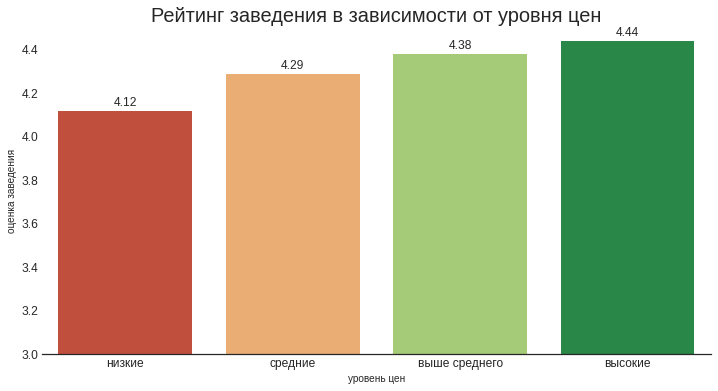

In [65]:
# визуализируем
barchart (12, 6, rating_price, rating_price.index, 'rating', palette3, 
             'Рейтинг заведения в зависимости от уровня цен', 'уровень цен', 'оценка заведения', 1, 1, 1, 0, 
                2, horizont=0, set_xticks=1, order=rating_price.sort_values('rating').index, ylim=[3,4.5])

В заведениях с высоким уровнем цен рейтинг выше.  
Возможно, в заведениях с более высоким уровнем цен действительно выше качество. 

Отметим все заведения на карте с помощью кластеров:

In [66]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_filt.apply(create_clusters, axis=1)

# выводим карту
m

**Рассмотрим самые популярные улицы по количеству заведений**

In [95]:
top_streets = data_filt.groupby('street').agg({'address':'count'}).sort_values(
                                            by='address', ascending=False).head(15)
top_streets

,address
street,
проспект Мира,183
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,87
Варшавское шоссе,76
Каширское шоссе,76
Ленинградское шоссе,70


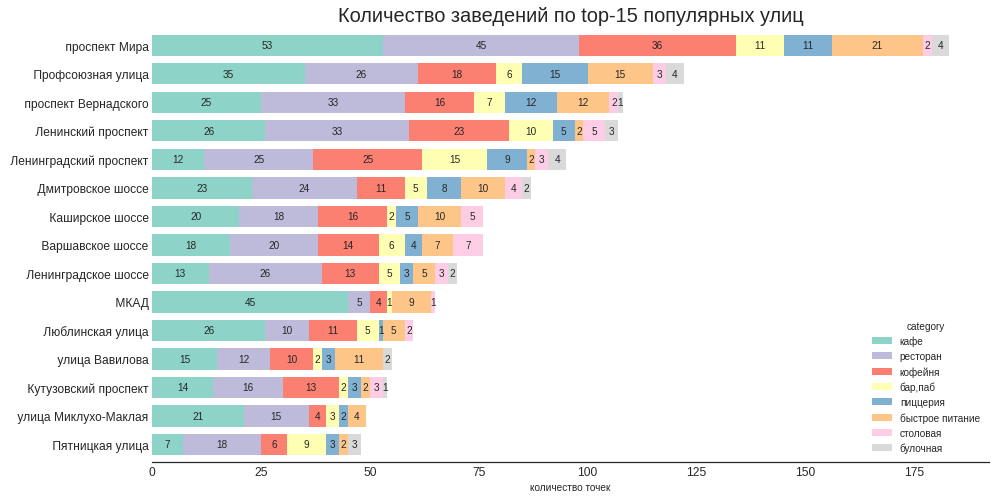

In [68]:
# подготовим данные для визуализации
top_streets_plot = data_filt.pivot_table(
    index='street', columns='category',values='address',aggfunc='count')
top_streets_plot['total'] = top_streets_plot.sum(axis = 1)
top_streets_plot = top_streets_plot.sort_values(by='total',ascending=False).head(15).sort_values(by='total')
top_streets_plot = top_streets_plot.loc[:,districts.columns != 'total']

# порядок колонок
cols = data_filt['category'].value_counts().index
# поменяем колонки местами
top_streets_plot = top_streets_plot[cols]

# визуализируем
barh (top_streets_plot, 15, 8, colors, 'Количество заведений по top-15 популярных улиц', 'количество точек', '', 
                                                                                          1, 1, 1, 0, 0,set_xticks=1)

Самая насыщенная заведениями улица - проспект Мира  
Также необходимо отметить Пятницкую улицу, для такой короткой улицы там очень много заведений

По категориям:  
Ленинградское шоссе - рестораны  
МКАД - кафе  
Ленинградский проспект - кофейни и бары  
Пятницкая улица - ресторан и бары




**Посмотрим улицы, на которых находится только одно заведение**

In [69]:
one_per_street = data_filt.pivot_table(
    index='street', columns='category',values='address',aggfunc='count', fill_value=0)
one_per_street['total'] = one_per_street.sum(axis = 1)
one_per_street = one_per_street[one_per_street['total']==1]
one_per_street.head(10)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
1-й Автозаводский проезд,0,0,0,1,0,0,0,0,1
1-й Балтийский переулок,0,0,0,0,0,0,1,0,1
1-й Варшавский проезд,0,0,0,1,0,0,0,0,1
1-й Вешняковский проезд,0,0,0,1,0,0,0,0,1
1-й Голутвинский переулок,1,0,0,0,0,0,0,0,1
1-й Грайвороновский проезд,1,0,0,0,0,0,0,0,1
1-й Дербеневский переулок,0,0,0,1,0,0,0,0,1
1-й Земельный переулок,0,0,0,0,0,0,1,0,1
1-й Капотнинский проезд,0,0,0,1,0,0,0,0,1


In [70]:
# добавмим признак одного заведения в таблицу
data_filt['one_per_street'] = data_filt['street'].isin(one_per_street.index.unique())

In [71]:
# распределение по округам
one_per_street_d = data_filt.groupby(['district_ad']).agg({'one_per_street':'sum','street':'nunique'})

# доля улиц с одним заведением среди общего числа улиц
one_per_street_d['share_streets,%'] = (one_per_street_d['one_per_street']*100/one_per_street_d['street']).round(1)
one_per_street_d = one_per_street_d.sort_values(by='share_streets,%', ascending = False)
one_per_street_d

,one_per_street,street,"share_streets,%"
district_ad,,,
Северный,52,150,34.7
Северо-Восточный,55,161,34.2
Центральный,145,457,31.7
Восточный,52,165,31.5
Западный,35,120,29.2
Юго-Восточный,39,134,29.1
Южный,43,152,28.3
Северо-Западный,19,76,25.0
Юго-Западный,18,79,22.8


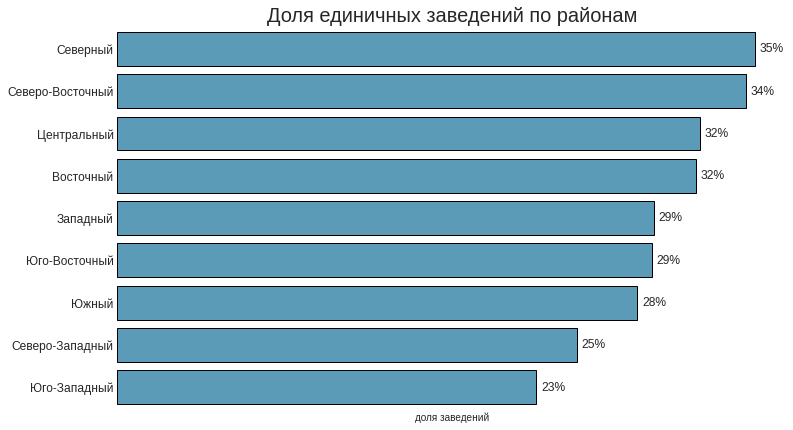

In [72]:
barchart (12, 7, one_per_street_d, 'share_streets,%', one_per_street_d.index, ['#4ca1c7'], 
          'Доля единичных заведений по районам', 'доля заведений', '',1,1,1,1,0,1,1, edgecolor='black')

Доля улиц с единиственным заведением среди всех улиц районов колеблется около 30%  
Больше всего таких улиц в Северном и Северо-Восточном округах, меньше всего в Юго-западном

In [73]:
# распределение единичных заведений по категориям
one_per_street_cat = data_filt.groupby(['category']).agg({'one_per_street':'sum','address':'count'})
# доля единичных заведений среди общего числа заведений
one_per_street_cat['share_places,%'] = (one_per_street_cat['one_per_street']*100/one_per_street_cat['address']).round(1)
one_per_street_cat.sort_values(by='one_per_street', ascending = False)

,one_per_street,address,"share_places,%"
category,,,
кафе,160,2377,6.7
ресторан,93,2038,4.6
кофейня,84,1412,5.9
"бар,паб",39,763,5.1
столовая,36,315,11.4
быстрое питание,23,603,3.8
пиццерия,15,633,2.4
булочная,8,256,3.1


Можно найти одинокое кафе на глухой улице, но не булочную

**Рассмотрим средний чек заведений по районам.**  
Возьмем медианное значение.

In [74]:
medium_bill_d = data_filt[data_filt['middle_avg_bill']>0].groupby(['district']).agg(
                                {'middle_avg_bill':'median'}).round(2).sort_values(by='middle_avg_bill', ascending=False)
medium_bill_d

,middle_avg_bill
district,
Западный административный округ,1000.0
Центральный административный округ,1000.0
Северо-Западный административный округ,700.0
Северный административный округ,650.0
Юго-Западный административный округ,600.0
Восточный административный округ,550.0
Северо-Восточный административный округ,500.0
Южный административный округ,500.0
Юго-Восточный административный округ,450.0


Самый высокий средний чек в Центральном и Западном округах  
Самый низкий в Юго-Восточном

In [75]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=medium_bill_d,
    columns=[medium_bill_d.index, 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

**Рассмотрим заведения с круглосуточным режимом работы**

In [76]:
# в целом
print('Доля круглосуточных заведений составялет {:.1f}%'.format(
            round(data_filt['is_24/7'].mean()*100,2)))

Доля круглосуточных заведений составялет 8.7%


In [77]:
# по категориям
categ_day_night = data_filt.groupby('category').agg({'is_24/7':'mean'}).sort_values(by='is_24/7',ascending=False)
categ_day_night.columns=['is_24_7']
categ_day_night['is_24_7'] = round(categ_day_night['is_24_7']*100,1)
categ_day_night

,is_24_7
category,
быстрое питание,24.9
кафе,11.2
булочная,9.4
"бар,паб",6.8
ресторан,6.5
пиццерия,4.9
кофейня,4.2
столовая,3.8


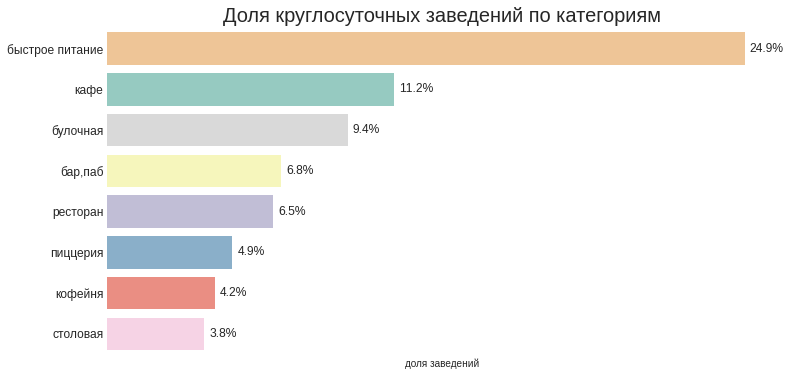

In [78]:
# визуализируем
barchart (12, 6, categ_day_night, 'is_24_7', categ_day_night.index, colors, 
          'Доля круглосуточных заведений по категориям', 'доля заведений', '',1,1,1,1,1,1,1)

Чаще всего с круглосуточным режимом работы встречаются заведения быстрого питания, что достаточно логично - поесть ночью это скорее функция, чем развлечение

## Вывод  


**Цель первой части исследования:**
 * выделить основные закномерности и особенности заведений общественного питания  

Для этого мы проанализировали датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года  

**Основные выводы**

Самые распространенные **категории** заведений — это **кафе**, **рестораны** и **кофейни**

Количество **посадочных мест** до **100**  
Реже встречается от 100 до 300 посадочных мест  
Меньше всего в булочных и пиццериях - до 50

**Доля сетевых** заведений в датасете **38%**  
Чаще всего сетевыми являются **булочные** - **61%**, пиццерии, кофейни - 50%  
Реже всего - бары - 22%

**Лидеры** сетевых заведений по **количеству точек** - **кофейни**, **пиццерии** и **кафе**  
Вверху списка такие бренды как **Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee**


Средний **рейтинг** заведений **4.23**  
Рейтинг большинства категорий ~ 4.30  
**Топ** рейтинга - **бары** - **4.4**  
Минимальные рейтинги у кафе и быстрого питания - 4.1  
Есть связь между уровнем цен и рейтингом - в заведениях **с высоким уровнем цен рейтинг выше**  
**Топ** рейтинга - **Центральный и Северо-Западный округа**

**География**

**Больше** всего заведений в **Центральном** округе - около **2200** точек  
**Меньше** всего в **Северо-Западном районе** - 400  
В остальных 700-900

По категориям:

**Бары** и **рестораны** максимально сосредоточены в **Центральном** районе  
Булочные, быстрое питание, пиццерии и кафе, встречаются в центре реже  
**Кофейни** равномерно распределены по **большинству** районов




Больше всего заведений на **проспекте Мира**  
Самая высокая концентрация - Пятницкая улица

**По категориям:**  
Ленинградское шоссе - рестораны  
Ленинградский проспект - кофейни и бары  
Пятницкая улица - ресторан и бары  
МКАД - кафе

Встречаются улицы, где находится один объект общепита, чаще всего это кафе

Самый **высокий средний чек** в **Центральном** и **Западном** округах  
Самый **низкий** в **Юго-Восточном**

Доля **круглосуточных** заведений составялет **8.7%**  
На первом месте среди них **заведения быстрого питания** - **25%**

 
 

## Обзор кофеен

Оценим долю кофеен среди общего количества категорий

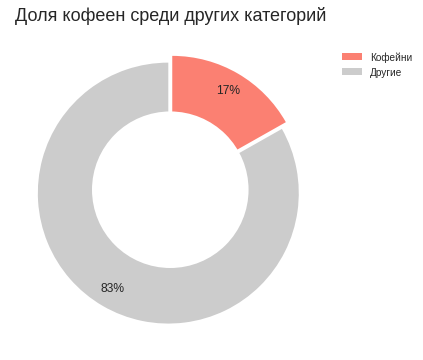

In [79]:
categories = [len(data_filt[data_filt['category']=='кофейня']),len(data_filt[data_filt['category']!='кофейня'])]
# визуализируем
donat (6, 6, categories, ['#fb8072','#cccccc'], 0, 'Доля кофеен среди других категорий', ['Кофейни','Другие'], 
                                                                                            counterclock=False)

**Рассмотрим расположение кофеен**

In [80]:
coffee_house = data_filt[data_filt['category']=='кофейня'].groupby(['district_ad']).agg(
                                {'address':'count'}).sort_values(by='address', ascending=False)
coffee_house['share_total,%'] = round(coffee_house['address']*100/coffee_house['address'].sum(),2)
display(coffee_house)

,address,"share_total,%"
district_ad,,
Центральный,428,30.31
Северный,193,13.67
Северо-Восточный,159,11.26
Западный,150,10.62
Южный,131,9.28
Восточный,104,7.37
Юго-Западный,96,6.80
Юго-Восточный,89,6.30
Северо-Западный,62,4.39


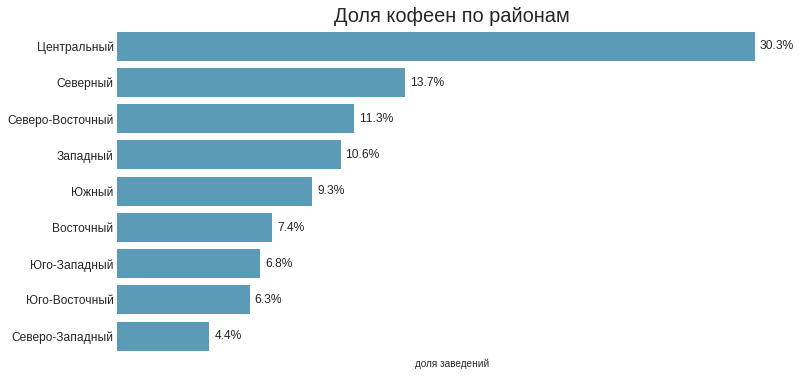

In [81]:
# визуализируем
barchart (12, 6, coffee_house, 'share_total,%', coffee_house.index, ['#4ca1c7'], 
          'Доля кофеен по районам', 'доля заведений', '',1,1,1,1,1,1,1)

Треть всех кофеен находится в центральном районе.

In [82]:
coffee_house

,address,"share_total,%"
district_ad,,
Центральный,428,30.31
Северный,193,13.67
Северо-Восточный,159,11.26
Западный,150,10.62
Южный,131,9.28
Восточный,104,7.37
Юго-Западный,96,6.80
Юго-Восточный,89,6.30
Северо-Западный,62,4.39


In [83]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

coffee_house = data_filt[data_filt['category']=='кофейня'].groupby(['district']).agg({'address':'count'})

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house,
    columns=[coffee_house.index,'address'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    #legend_name='Количество кофеен по районам',
).add_to(m3)

# выводим карту
m3

Рассмотрим объекты на карте:

In [84]:
# создаём карту Москвы
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(c)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_filt[data_filt['category']=='кофейня'].apply(create_clusters, axis=1)

# выводим карту
c

Часто кофейни распологаются кластерами, например рядом с метро, с развлекательными объектами или другими заведениями, тк кофейня требует проходного и удобного места, в отличии, например, от ресторана, в который можно пойти целенаправленно

Посмотрим на распределение кофеен по улицам

In [85]:
coffee_streets = data_filt[data_filt['category']=='кофейня'].groupby(
            'street').agg({'address':'count'}).sort_values(by='address', ascending=False).head(10)
# добавим общее количество заведений на улице
coffee_streets = coffee_streets.join(data_filt.groupby('street').agg({'address':'count'}), rsuffix = '_total')
# посчитаем долю кофеен среди общего количества заведений
coffee_streets['share,%'] = (coffee_streets['address']*100/coffee_streets['address_total']).round(1)
coffee_streets

,address,address_total,"share,%"
street,,,
проспект Мира,36,183,19.7
Ленинградский проспект,25,95,26.3
Ленинский проспект,23,107,21.5
Профсоюзная улица,18,122,14.8
проспект Вернадского,16,108,14.8
Каширское шоссе,16,76,21.1
Варшавское шоссе,14,76,18.4
Кутузовский проспект,13,54,24.1
Новослободская улица,13,36,36.1


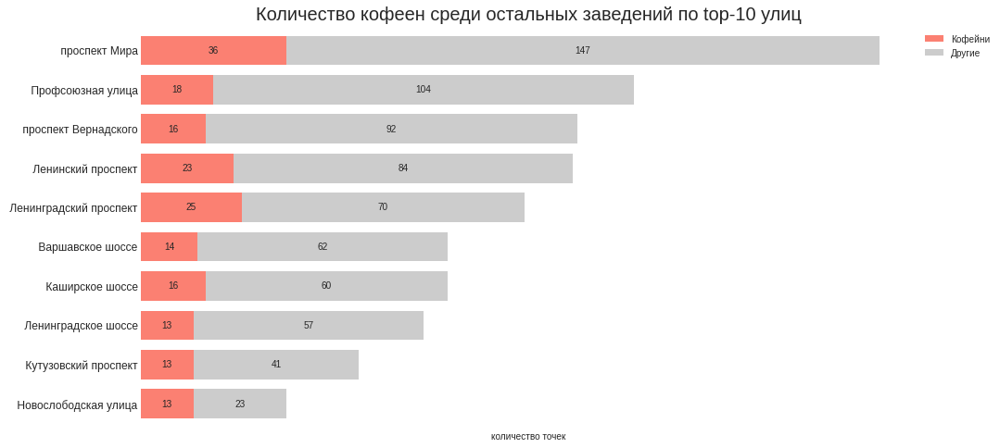

In [86]:
# подготовим данные
coffee_streets_plot = coffee_streets
coffee_streets_plot['other'] = coffee_streets_plot['address_total']-coffee_streets_plot['address']
coffee_streets_plot=coffee_streets_plot[['address','other']].sort_values(by='other')
# визуализируем
barh (coffee_streets_plot, 15, 8, ['#fb8072','#cccccc'], 
          'Количество кофеен среди остальных заведений по top-10 улиц', 'количество точек', '', 1, 1, 1, 1, 0,
                                                                      legend=1, legend_text=['Кофейни','Другие'])

Больше всего кофеен по количеству на проспекте Мира	
Самая кофейная улица с точки зрения доли среди общего числа заведений - Новослободская. Интересно, что в целом на ней немного заведений, но больше трети это кофейни.  
Также высокая доля кофеен на Ленинградском, Кутузовском проспектах

**Рассмотрим зависимость расположения кофеен от других заведений из списка топ15 улиц**

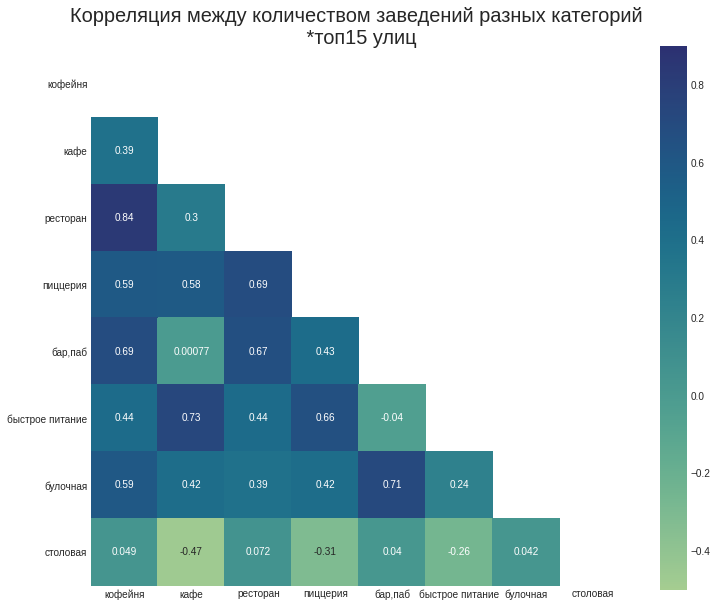

In [87]:
# порядок сортировки
order = ['кофейня', 'кафе', 'ресторан', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая']
# визуализируем
plt.figure(figsize=(12, 10))
corr = top_streets_plot.corr()
corr = corr.reindex(index=order, columns=order)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
ax = sns.heatmap(corr, annot=True, mask=mask, vmin=-0.5, vmax=0.9, cmap='crest', cbar=True, square=True)
ax.axes.set_title('Корреляция между количеством заведений разных категорий \n *топ15 улиц', size =20)
ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(labelsize=10);

Кофейни сопутствуют почти всем заведениям, кроме столовых.  
Самая высокая корреляция с ресторанам и барам, чуть меньше с пиццериями и булочными, т.к. кофейни скорее дополняют эти заведения, а не конкурируют с ними.

**Вывод по расположению**  
30% кофеен находится в центральном районе.  
Часто кофейни располагаются кластерами, например рядом с метро, с развлекательными объектами или другими заведениями(особенно ресторанами и барами), тк кофейня требует проходимого и удобного места, в отличии, например, от ресторана, в который можно пойти специально  
Самая высокая доля кофеен среди общего числа заведений на Новослободской улице и на Ленинградском и Кутузовском проспектах.  

**Посмотрим на режимы работы кофеен**

In [88]:
print('Доля круглосуточных кофеен составляет:{:.1f}%'.format(
            round(data_filt[data_filt['category']=='кофейня']['is_24/7'].mean()*100,2)))

Доля круглосуточных кофеен составляет:4.2%


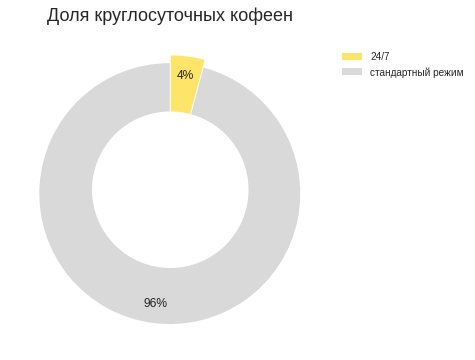

In [89]:
# подсчет значений
hours_donat = [len(data_filt[(data_filt['category']=='кофейня')&(data_filt['is_24/7']==1)]),
                len(data_filt[(data_filt['category']=='кофейня')&(data_filt['is_24/7']==0)])]

# визуализируем
donat (6, 6, hours_donat, ['#ffe46a','#d9d9d9'], 0, 'Доля круглосуточных кофеен', ['24/7','стандартный режим'], counterclock=False)

Кофейни не предпологают круглосуточного режима работы

**Рассмотрим как распределяются рейтинги кофеен по районам**

In [90]:
rating_coffee = data_filt[data_filt['category']=='кофейня'].groupby(['district']).agg(
                {'rating':'mean'}).round(2).sort_values(by='rating', ascending=False)
display(rating_coffee)
print('Средний рейтинг кофеен равен {:.2f}'.format(
            data_filt[data_filt['category']=='кофейня']['rating'].mean()))

,rating
district,
Центральный административный округ,4.34
Северо-Западный административный округ,4.33
Северный административный округ,4.29
Восточный административный округ,4.28
Юго-Западный административный округ,4.28
Юго-Восточный административный округ,4.23
Южный административный округ,4.23
Северо-Восточный административный округ,4.22
Западный административный округ,4.20


Средний рейтинг кофеен равен 4.28


Посмотрим на карте

In [91]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=[rating_coffee.index, 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m4)

# выводим карту
m4

Рейтинги кофеен мало различаются по районам, рейтинг по большинству районов ~ 4.3

Посмотрим зависит ли рейтинг от принадлежности к сети:

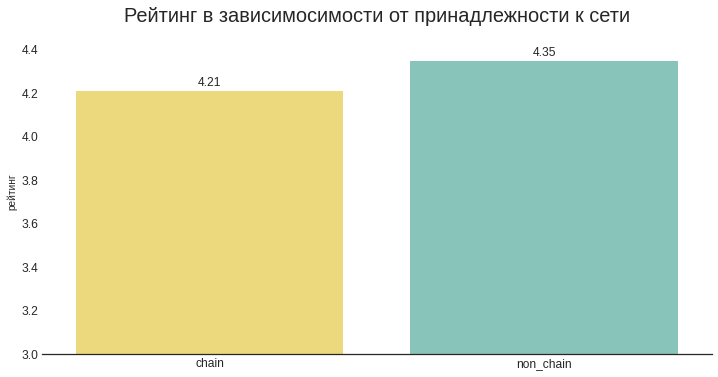

In [92]:
# подготовим данные
rating_coffee_chain = data_filt[data_filt['category']=='кофейня'].groupby(['chain']).agg(
                {'rating':'mean'}).round(2).sort_values(by='rating', ascending=False).rename(
                                                                                        index={0: 'non_chain', 1: 'chain'})
# визуализируем
barchart (12, 6, rating_coffee_chain, rating_coffee_chain.index,'rating', colors2, 
             'Рейтинг в зависимосимости от принадлежности к сети', '', 'рейтинг',1,1,1,0,2,
              set_xticks=1, ylim=[3, 4.5], horizont=0, order=rating_coffee_chain.sort_values('rating').index)

Рейтинг сетей ниже  - 4.21 против 4.35 у единичных

**Рассмотрим на распределение цены чашки кофе**

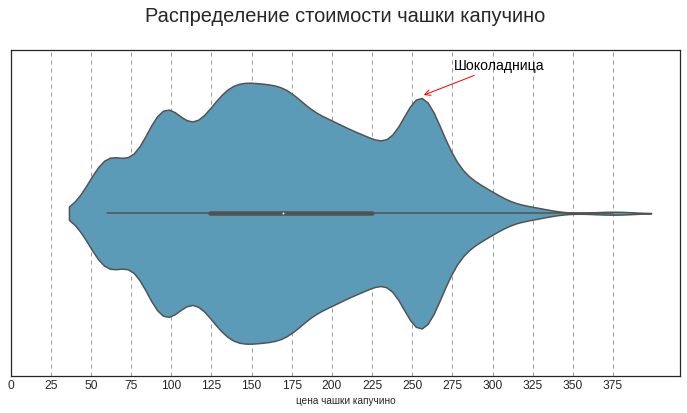

In [93]:
plt.figure(figsize=(12, 6))

ax=sns.violinplot(
    data = data_filt[(data_filt['category']=='кофейня')&(data_filt['middle_coffee_cup']>0)], x='middle_coffee_cup',
           inner = 'box', color = '#4ca1c7', bw=.18)

ax.xaxis.grid(True, color ="gray")
ax.axes.set_title('Распределение стоимости чашки капучино\n ', size =20)
ax.set_xlabel('цена чашки капучино')
ax.tick_params(axis='x', labelsize=12, grid_linestyle=(0, (5, 5)))
plt.xticks(np.arange(0, data_filt['middle_coffee_cup'].max()+1, 25))

plt.annotate('Шоколадница', xy = (256,-0.36), 
             fontsize = 14, xytext = (276,-0.44), 
             arrowprops = dict(arrowstyle="->", color = 'red'),
             color = 'black');



В распределение цены наблюдается два пика:
 * 125-200 ₽ - большинство кофеен
 * 256 ₽ - цена в Шоколаднице  

Для сохранения конкурентоспособности новой кофейни хорошо будет ориентироваться на стоимость 140 - 180 ₽, в зависимости от целевой маржинальности и себестоимости продукта.  
Если делать упор на доступность кофейни, то придерживаться нижней границы диапазона

**Рекомендации по открытию:**  
 * Исходя из логики, что "откусывать" проще от большого куска, открываться нужно в Центральном районе, где есть спрос на кофейни  
 * Выбирать место, где поблизости существуют рестораны, бары, пиццерии  
 * Избегать улиц с уже высокой долей кофеен (Новослободская, Ленинградский, Кутузовский проспект)  
 * Ближайшие кофейни-конкуренты должны быть с рейтингами ниже средних  
 * Допустимо вставать рядом с Шоколадницей при условии, что стоимость чашки кофе будет ниже  
 * Ориентировочная цена чашки капучино 140 - 180 ₽
